# <a href="https://thetahat.ru/courses/ad">Введение в анализ данных</a>
## Домашнее задание 3, <font color="blue">легкая часть</font>. Линейная и логистическая регрессии.


**Правила, <font color="red">прочитайте внимательно</font>:**

* Выполненную работу нужно отправить телеграм-боту `@thetahat_ds25_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. Дождитесь подтверждения от бота, что он принял файл. Если подтверждения нет, то что-то не так. **Работы, присланные иным способом, не принимаются.**
* Дедлайн см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно **ноутбук в формате `ipynb`**. Если вы строите интерактивные графики, их стоит прислать в формате html.
* Следите за размером файлов. **Бот не может принимать файлы весом более 20 Мб.** Если файл получается больше, заранее разделите его на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания всем участникам списывания дается штраф -2 балла к итоговой оценке за семестр.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Обратите внимание на <a href="https://thetahat.ru/courses/ai-rules"><b>правила использования ИИ-инструментов</b></a> при решении домашнего задания.
* **Код из рассказанных на занятиях ноутбуков** можно использовать без ограничений.
* Для выполнения задания используйте этот ноутбук в качестве основы, ничего не удаляя из него. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Решение проверяется системой ИИ-проверки <a href="https://thetahat.ru/"><img src="https://miptstats.github.io/theta_grader_small.png" style="display: inline; vertical-align: middle;"></a> **ThetaGrader**. Результат проверки валидируется и исправляется человеком, после чего комментарии отправляются студентам.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*
* **Код из рассказанных на занятиях ноутбуков** можно использовать без ограничений.

**Правила оформления теоретических задач:**

* Решения необходимо оформить в виде $\LaTeX$ в markdown-ячейках. Иные способы (в т.ч. фотографии) не принимаются.
* Если вы не знаете $\LaTeX$, используйте ИИ-инструменты для оформления черновика решения. Примеры были показаны на лекции 2 по ИИ-инструментам.
* **В решениях поясняйте, чем вы пользуетесь**, хотя бы кратко. 
* Решение, в котором есть только ответ, и отсутствуют вычисления, оценивается в 0 баллов.


<b><font size="5" color="red">Важно!!! Правила заполнения ноутбука:</font></b>
* Запрещается удалять имеющиеся в ноутбуке ячейки, менять местами положения задач.
* Сохраняйте естественный линейный порядок повествования в ноутбуке сверху-вниз.
* Отвечайте на вопросы, а также добавляйте новые ячейки в предложенных местах, которые обозначены `<...>`.
* В markdown-ячейка, содержащих описание задачи, находятся специальные отметки, которые <font color="red"><b>запрещается модифицировать</b></font>.
* При нарушении данных правил работа может получить 0 баллов.


**Баллы за задание:**

<b><font color="blue">Легкая часть</font></b> (достаточно на "хор"):

* Задача 1 &mdash; 20 баллов
* Задача 2 &mdash; 80 баллов
* Задача 3 &mdash; 30 баллов;
* Задача 4 &mdash; 20 баллов;

<b><font color="orange">Сложная часть</font></b> (необходимо на "отл"):

* Задачи 5-7: скачайте второй ноутбук с условием задания со страницы курса.

Баллы учитываются в <b>обязательной части</b> курса и не влияют на оценку по факультативной части.

In [ ]:
# Bot check

# HW_ID: fpmi_ad3_part1
# Бот проверит этот ID и предупредит, если случайно сдать что-то не то.

# Status: final
# Перед отправкой в финальном решении удали "not" в строчке выше.
# Так бот проверит, что ты отправляешь финальную версию, а не промежуточную.
# Никакие значения в этой ячейке не влияют на факт сдачи работы.

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid", palette="Set2")

При решении задания используйте `sklearn`. Пропишите сюда необходимые импорты

In [10]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler


from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn import metrics
sns.set(font_scale=1.3, palette="Set2")
RANDOM_STATE = 55  # фиксируем зерно случайности
DAYS_PER_YEAR = 365  # количество дней в году
pd.options.mode.chained_assignment = None

---
### <font color="blue"><i>Легкая часть</i></font>

---
### Задача 1.

<!-- Внимание! Здесь находится специальная отметка. Ее нельзя удалять! Ответы на вопросы / выводы для предыдущего пункта(ов) пиши в ячейках выше! -->
<!-- 146d04157c07b08ee58d3eafdcf82c32 -->
Рассмотрим модель одномерной линейной регрессии *без свободного параметра* $y(x) = \theta x$, где $x\in \mathbb{R}$ и $\theta \in \mathbb{R}$. Предполагаем, что данные получены по правилу
$$Y_i = \theta x_i + \varepsilon_i,$$
где $i \in \{1, ..., n\}$, числа $x_i \in \mathbb{R}$ неслучайны, а $\varepsilon_i$ &mdash; случайные ошибки.

**1.** Посчитайте оценку $\widehat{\theta}$ методом наименьших квадратов по явной формуле.

**2.** Выпишите формулы итераций градиентного спуска (GD) и стохастического градиентного спуска (SGD) для поиска $\widehat{\theta}$. Не забудьте указать, как в SGD математически определяется батч (набор объектов на каждой итерации).

**3.** Опишите, что произойдет, если для некоторого $i$ ошибка $\varepsilon_i$ будет очень большой.


*Замечания.*
1. Это теоретическая задача, не перепутайте 😄
2. В ответе во всех пунктах могут оставаться суммы $n$ слагаемых, но не должно быть операций с векторами или матрицами.
3. **Прочитайте требования к формату решения в правилах сдачи задания.**

Ниже приведён конвертированный текст в формате Markdown:

---

# Оценка коэффициентов линейной регрессии

## Задача

Рассмотрим модель одномерной линейной регрессии *без свободного параметра*  
$$y(x) = \theta x,$$  
где $(x \in \mathbb{R})$  и $ (\theta \in \mathbb{R})$ . Предполагаем, что данные получены по правилу

$$
Y_i = \theta x_i + \varepsilon_i,
$$

где $( i \in \{1, \ldots, n\})$, числа $ x_i \in \mathbb{R}$ неслучайны, а $\varepsilon_i $ — случайные ошибки.

## 1. Оценка $\widehat{\theta}$ методом наименьших квадратов

На лекции было доказано, что оценка $\widehat{\theta}$ определяется как:

$$
\widehat{\theta} = (X^T X)^{-1} X^T Y
$$

Компоненты выражения вычисляются следующим образом:

- $ X^T X = \sum_{i=1}^{n} x_i^2 $
- $ (X^T X)^{-1} = \frac{1}{\sum_{i=1}^{n} x_i^2} $
- $ X^T Y = \sum_{i=1}^{n} x_i y_i $

Подставляя эти выражения, получаем итоговую формулу:

$$
\widehat{\theta} = \frac{\sum_{i=1}^{n} x_i y_i}{\sum_{i=1}^{n} x_i^2}
$$

## 2. Формулы итераций градиентного спуска (GD) и стохастического градиентного спуска (SGD) для поиска $\widehat{\theta}$

Пусть $\eta$ — шаг градиентного спуска на $k$-й итерации.

### Градиентный спуск (GD)

Формула итерации градиентного спуска:

$$
\theta_{k+1} = \theta_{k} - \eta X^T (X \theta_k - Y)
$$

Выразим через суммы. Заметим, что:

$$
X^T (X \theta_k - Y) = \sum_{i=1}^{n} x_i (x_i \theta_k - Y_i)
$$

Подставим в формулу:

$$
\theta_{k+1} = \theta_{k} - \eta \sum_{i=1}^{n} x_i (x_i \theta_k - Y_i)
$$

Раскроем выражение:

$$
\theta_{k+1} = \theta_{k} - \eta \sum_{i=1}^{n} (x_i^2 \theta_k - x_i Y_i) = \theta_{k} - \eta \theta_k\sum_{i=1}^{n} x_i^2  + \eta \sum_{i=1}^{n} x_i y_i
$$

Итоговая формула:

$$
\theta_{k+1} =  \theta_{k} - \eta \theta_k\sum_{i=1}^{n} x_i^2  + \eta \sum_{i=1}^{n} x_i y_i
$$

### Стохастический градиентный спуск (SGD)

Формула итерации стохастического градиентного спуска:

$$
\theta_{k+1} = \theta_k - \eta \sum_{i \in B_k} x_i (x_i \theta_k - Y_i)
$$

Выразим через суммы. Заметим, что сумма берётся по батчу $B_k$, который является случайным подмножеством индексов $\{1, \ldots, n\}$ размера $b$, где $b \leq n$:

$$
\sum_{i \in B_k} x_i (x_i \theta_k - Y_i)
$$

На каждой итерации $k$ батч $B_k$ выбирается заново. При этом выбор индексов в батч осуществляется с равномерным распределением, то есть каждый индекс из $\{1, \ldots, n\}$ имеет одинаковую вероятность $1/n$ быть выбранным. Батч $B_k$ может совпадать с уже использованными ранее, так как выборка допускает повторения.

Подставим в формулу:

$$
\theta_{k+1} = \theta_k - \eta \sum_{i \in B_k} x_i (x_i \theta_k - Y_i)
$$

Раскроем выражение:

$$
\theta_{k+1} = \theta_k - \eta \sum_{i \in B_k} (x_i^2 \theta_k - x_i Y_i) = \theta_k - \eta \theta_k \sum_{i \in B_k} x_i^2 + \eta \sum_{i \in B_k} x_i Y_i
$$

Итоговая формула:

$$
\theta_{k+1} = \theta_k - \eta \theta_k \sum_{i \in B_k} x_i^2 + \eta \sum_{i \in B_k} x_i Y_i
$$

## Влияние большой ошибки $\varepsilon_i$

Если для некоторого $i$ ошибка $\varepsilon_i$ будет очень большой, это означает, что точка $(x_i, Y_i)$ является выбросом, то есть сильно отклоняется от предполагаемой зависимости $Y = \theta x$. Рассмотрим, как это повлияет на оценку параметра $\widehat{\theta}$ в трёх методах: методе наименьших квадратов (МНК), градиентном спуске (GD) и стохастическом градиентном спуске (SGD).

### 1. Метод наименьших квадратов (МНК)

В МНК оценка $\widehat{\theta}$ вычисляется по явной формуле:

$$
\widehat{\theta} = \frac{\sum_{i=1}^n x_i Y_i}{\sum_{i=1}^n x_i^2}
$$

Поскольку $Y_i = \theta x_i + \varepsilon_i$, подставим это выражение:

$$
\widehat{\theta} = \frac{\sum_{i=1}^n x_i (\theta x_i + \varepsilon_i)}{\sum_{i=1}^n x_i^2} = \theta + \frac{\sum_{i=1}^n x_i \varepsilon_i}{\sum_{i=1}^n x_i^2}
$$

Если $\varepsilon_i$ очень велико по модулю, то слагаемое $x_i \varepsilon_i$ в числителе может существенно изменить значение $\widehat{\theta}$. Величина и направление смещения зависят от знаков $x_i$ и $\varepsilon_i$:

- Если $x_i > 0$ и $\varepsilon_i > 0$, то $\widehat{\theta} > \theta$ (оценка завышена).
- Если $x_i > 0$ и $\varepsilon_i < 0$, то $\widehat{\theta} < \theta$ (оценка занижена).

Таким образом, в МНК большая ошибка $\varepsilon_i$ приводит к сильному смещению оценки $\widehat{\theta}$, и чем больше $|x_i|$, тем сильнее это влияние.

### 2. Градиентный спуск (GD)

В градиентном спуске параметр $\theta$ обновляется итеративно:

$$
\theta_{k+1} = \theta_k - \eta \sum_{i=1}^n x_i (x_i \theta_k - Y_i)
$$

Подставим $Y_i = \theta x_i + \varepsilon_i$:

$$
\theta_{k+1} = \theta_k - \eta \sum_{i=1}^n x_i (x_i \theta_k - \theta x_i - \varepsilon_i) = \theta_k + \eta \sum_{i=1}^n x_i \varepsilon_i - \eta (\theta_k - \theta) \sum_{i=1}^n x_i^2
$$

Большая $\varepsilon_i$ вносит значительный вклад в слагаемое $\eta \sum_{i=1}^n x_i \varepsilon_i$, что сдвигает $\theta_{k+1}$ на каждой итерации. Поскольку GD минимизирует ту же функцию потерь, что и МНК (сумму квадратов ошибок), при сходимости $\theta_k$ приблизится к значению, близкому к $\widehat{\theta}$ из МНК. Следовательно, оценка будет смещена так же, как в МНК, в зависимости от знаков $x_i$ и $\varepsilon_i$.

### 3. Стохастический градиентный спуск (SGD)

В SGD обновление параметра происходит по батчам $B_k$:

$$
\theta_{k+1} = \theta_k - \eta \sum_{i \in B_k} x_i (x_i \theta_k - Y_i)
$$

Если точка с большой $\varepsilon_i$ попадает в батч $B_k$, то слагаемое 
$$
x_i (x_i \theta_k - Y_i) = x_i \bigl(x_i (\theta_k - \theta) - \varepsilon_i\bigr)
$$  
вносит значительное изменение в $\theta_{k+1}$. Однако влияние выброса зависит от того, как часто эта точка включается в батчи:

- Если выброс попадает в батчи часто, $\theta_k$ будет смещаться в сторону, аналогичную GD и МНК.
- Если выброс включается редко, его влияние ослабляется благодаря стохастической природе метода.

В среднем, при большом числе итераций, SGD также даёт смещённую оценку, но смещение может быть менее выраженным, чем в МНК или GD, особенно при больших выборках и малых батчах.

## Вывод

Большая ошибка 
$$
\varepsilon_i\
$$:
- **В МНК** вызывает сильное смещение $\widehat{\theta}$, пропорциональное $x_i \varepsilon_i$.
- **В GD** приводит к сходимости к смещённой оценке, схожей с МНК.
- **В SGD** также смещает оценку, но влияние выброса ослаблено случайным выбором батчей, что может сделать метод более устойчивым.

Все три метода чувствительны к выбросам, но SGD может проявлять большую устойчивость благодаря своей стохастической природе.

---

**Окончательные ответы по пунктам:**

1. 
   $$
   \widehat{\theta} = \frac{\sum_{i=1}^{n} x_i Y_i}{\sum_{i=1}^{n} x_i^2}.
   $$

2. 
   $$
   \theta_{k+1}^{\text{GD}} = \theta_k - \eta \left(\theta_k\sum_{i=1}^{n} x_i^2 - \sum_{i=1}^{n} x_i Y_i\right), \quad
   $$
   $$
   \theta_{k+1}^{\text{SGD}} = \theta_k - \eta \left(\theta_k\sum_{i\in B_k} x_i^2 - \sum_{i\in B_k} x_i Y_i\right),
   $$
   
   где $B_k$ — батч на итерации $k$.

3.  
   При наличии наблюдения с очень большой ошибкой $\varepsilon_i$ оценка $\widehat{\theta}$ будет смещена на величину, зависящую от $x_i\varepsilon_i$; это негативно влияет на итоговую оценку в методе МНК, а в алгоритмах GD и SGD приводит к искажению обновлений, что может ухудшить сходимость.

   


<!-- Внимание! Здесь находится специальная отметка. Ее нельзя удалять! Ответы на вопросы / выводы для предыдущего пункта(ов) пиши в ячейках выше! -->
<!-- 00000000000000000000000000000000 -->
---
### Задача 2.

*Перед выполнением задачи ознакомтесь с <a href="https://thetahat.ru/courses/ad/main/3/ad_linreg_sklearn">ноутбуком по линейной регрессии</a> с занятия.*

Скоро весна и лето &mdash; идеальное время года для путешествий и прогулок на велосипедах. В крупных городах обычно развиты сети проката велосипедов или самокатов, предоставляющие удобный сервис. Одной из важных задач таких компаний является прогнозирование количества арендованных велосипедов в зависимости от времени года и погодных условий.

Рассмотрим датасет <a target="_blank" href="https://archive.ics.uci.edu/ml/datasets/Bike+Sharing+Dataset">Bike Sharing Dataset</a> от компании <a target="_blank" href="https://www.capitalbikeshare.com/">Capital Bikeshare</a>, располагающей автоматизированными пунктами проката велосипедов. В датасете по дням записаны календарная информация и погодные условия, а также число прокатов в этот день. Цель &mdash; предсказать количество арендованных велосипедов по остальным характеристикам.

<img src="https://thetahat.ru/files/ad/main/3/bike1.jpeg">

Будем работать только со следующими признаками:
* `season`: время года: 1 &mdash; зима, 2 &mdash; весна, 3 &mdash; лето, 4 &mdash; осень;
* `mnth`: месяц от 1 до 12;
* `holiday`: является ли текущий день праздничным;
* `weekday`: день недели от 0 до 6;
* `workingday`: является ли текущий день рабочим или выходным;
* `weathersit`: оценка благоприятности погоды от 1 (чистый, ясный день) до 4 (ливень, туман);
* `temp`: температура в Цельсиях;
* `atemp`: температура по ощущениям в Цельсиях;
* `hum`: влажность воздуха;
* `windspeed`: скорость ветра;
* `cnt`: количество арендованных велосипедов в текущий день.

---

Скачайте данные, загрузите их с помощью `pandas` и разделите на обучающую и тестовую части в соотношении 4:1. Далее всю аналитику необходимо проводить только на обучающей части данных.

In [57]:
data_day = pd.read_csv("day.csv", parse_dates=[1])
train, test = train_test_split(data_day, test_size=0.2, random_state=RANDOM_STATE)
train.shape, test.shape
data_day.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600


<!-- Внимание! Здесь находится специальная отметка. Ее нельзя удалять! Ответы на вопросы / выводы для предыдущего пункта(ов) пиши в ячейках выше! -->
<!-- 7e2346d718d374e3f957928b573e2a30 -->
#### 1. Визуальный анализ

Посмотрите по графикам, как *целевой признак зависит от остальных* и поймите характер этой зависимости. Старайтесь строить информативные графики, а из финального решения убирать те, которые не пригодились.

Какие признаки категориальные, а какие &mdash; вещественные? Учтите это при построении информативных графиков.

*Указание*. Среди признаков есть такие, значения которых как-то упорядочены, и их относительно небольшое количество. Чтобы понять, являются ли они категориальными, попробуйте понять, как с их значениями будут работать линейные модели. Иначе говоря, допустимо ли с точки зрения природы данных выполнять арифметические операции между *любыми* значениями этого признака, согласуется ли это со смыслом, который несет в себе данный признак?

In [58]:
#Поделим признаки на категориальные, вещественные, а также целевой
categorial_features = [
    "season",
    "mnth",
    "holiday",
    "weekday",
    "workingday",
    "weathersit",
]  # категориальные признаки
real = ["temp", "atemp", "hum", "windspeed"]  # вещественные признаки
target = "cnt"  # целевой признак


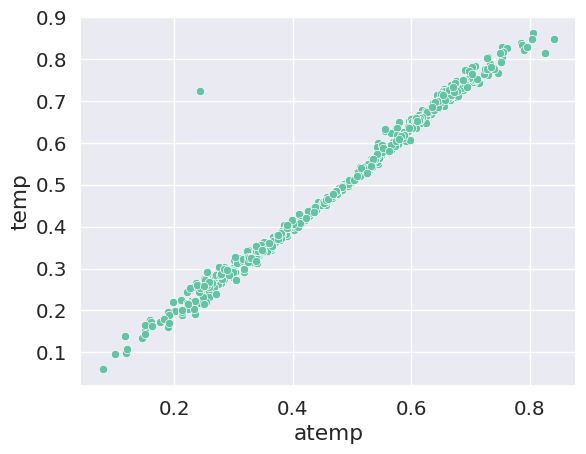

In [59]:
#Рассмотрим вопрос а почему у нас 2 темперауры?
sns.scatterplot(train, x="atemp", y="temp")
plt.show()


Видно что они практически совпадают, поэтому дальше будем исопльзовать только реальную температуру. 

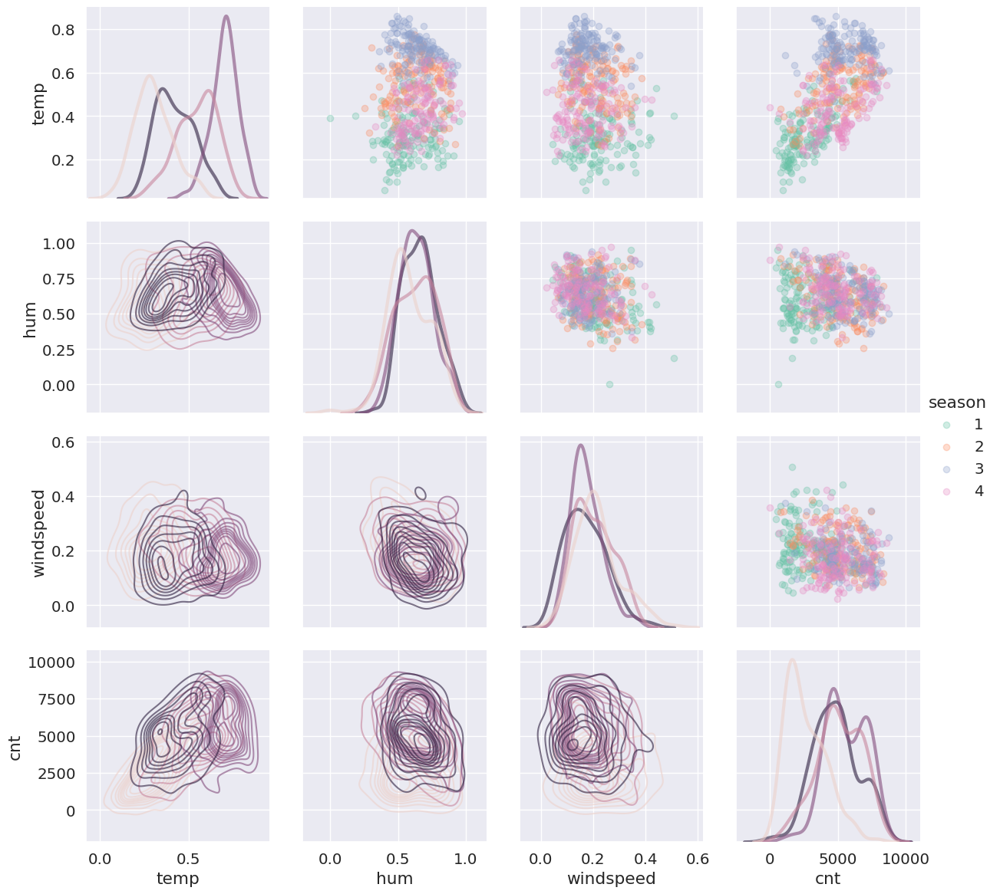

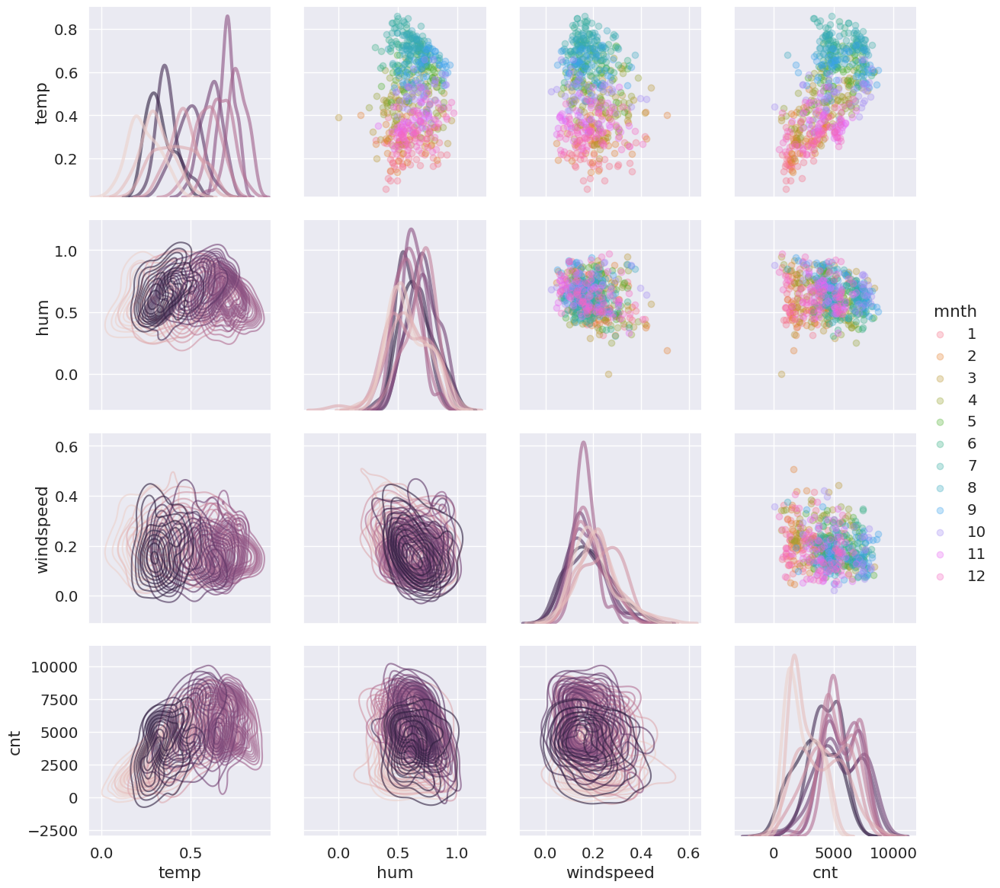

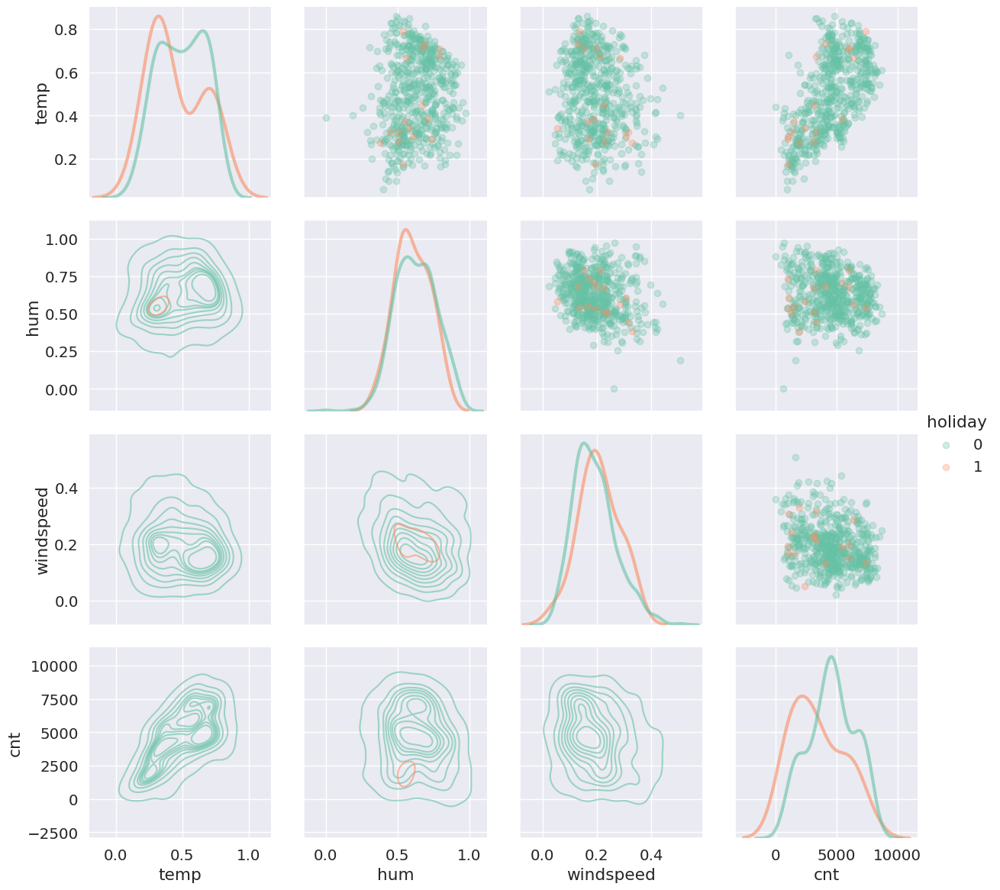

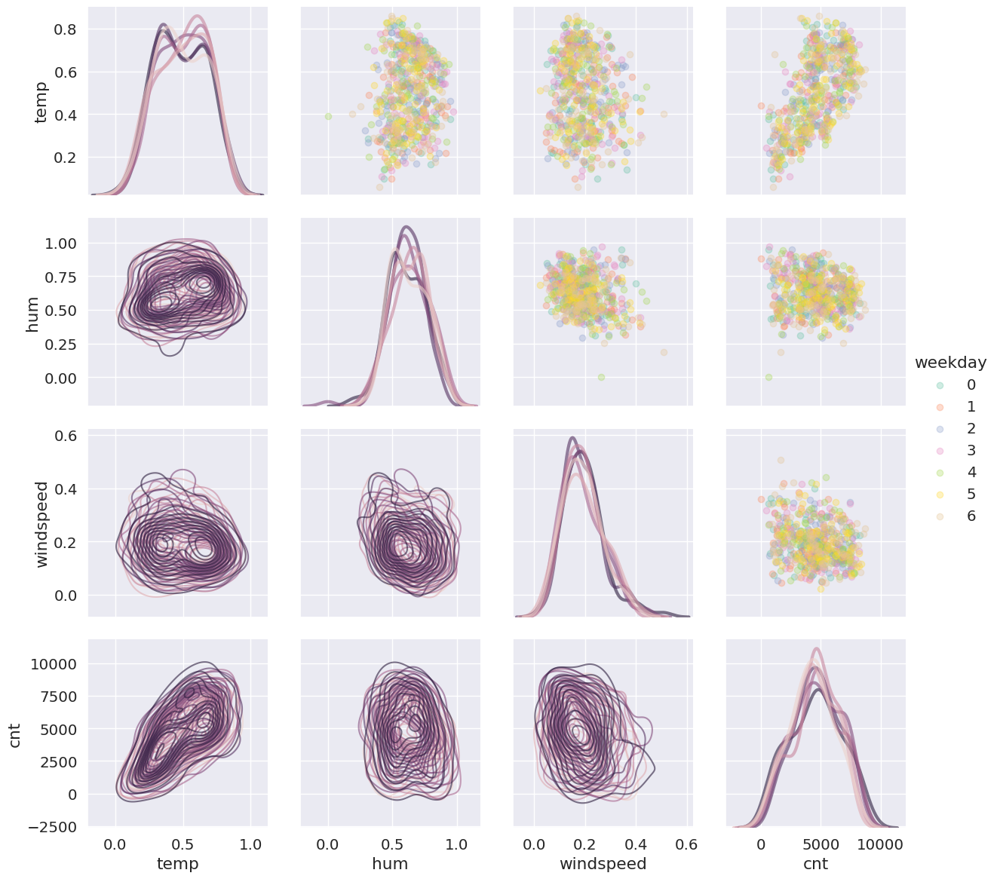

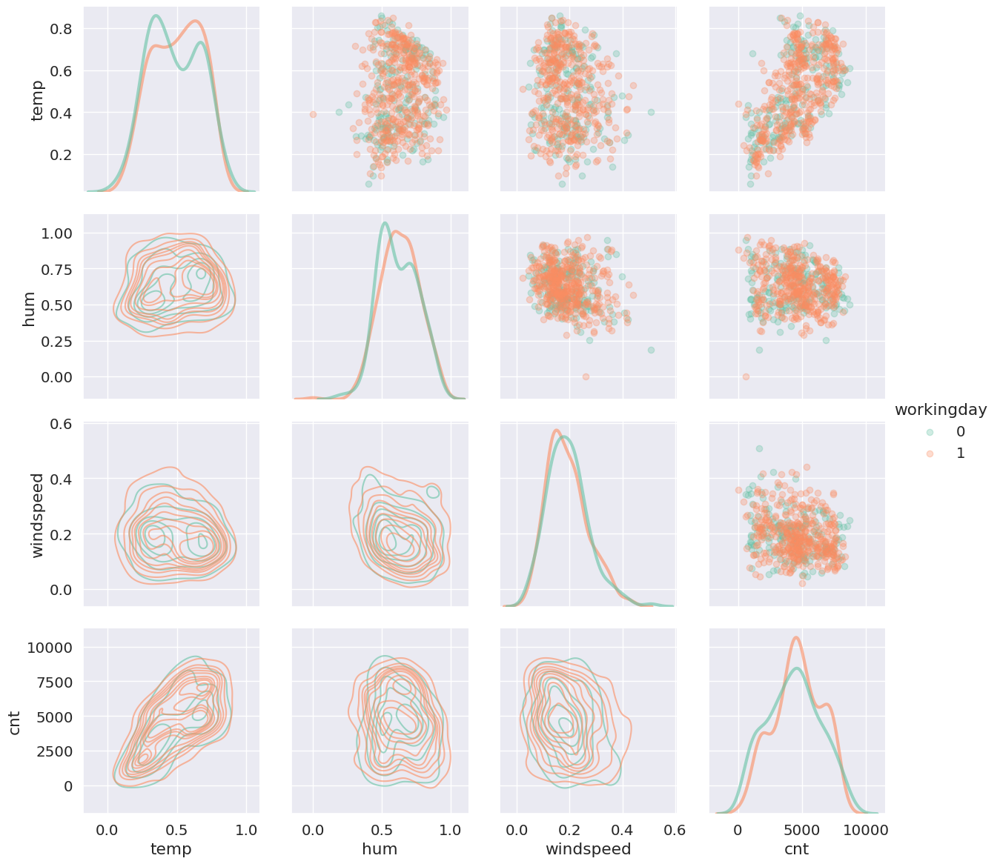

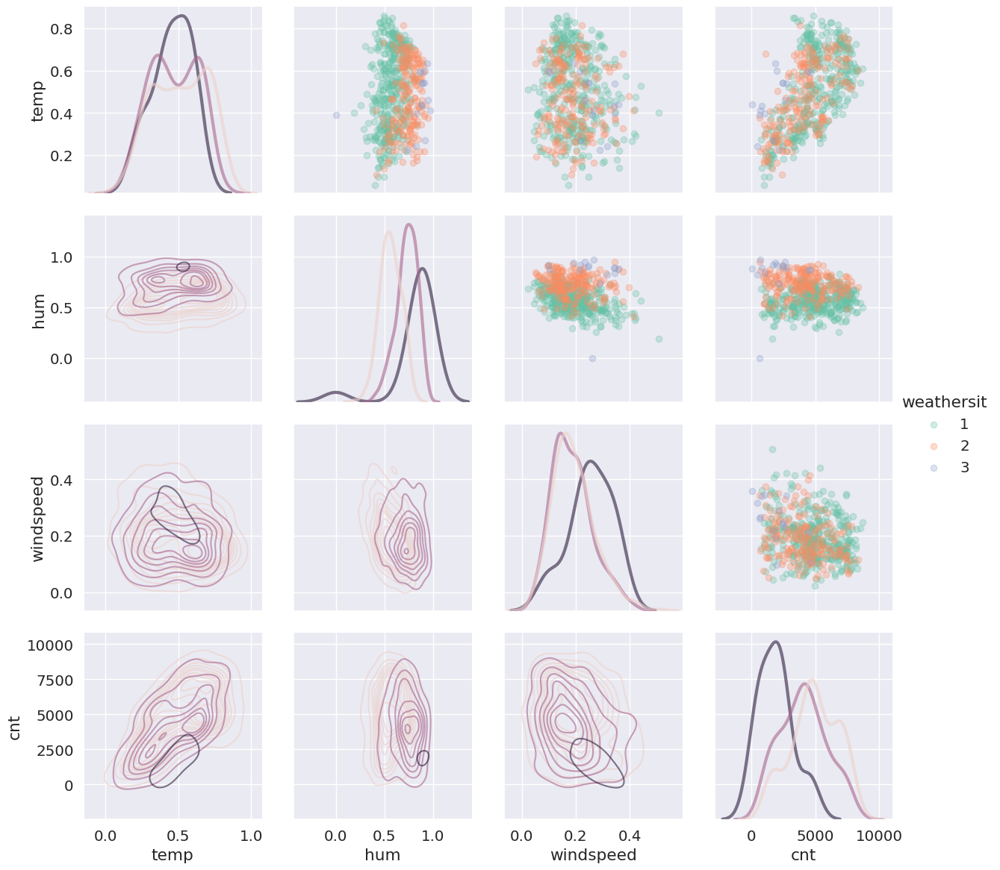

In [60]:
for hue in categorial_features:
    pair_grid = sns.PairGrid(
        train[["temp", "hum", "windspeed", "cnt", hue]],
        hue=hue,
        diag_sharey=False,
        height=3
    )
    
    pair_grid.map_lower(sns.kdeplot, alpha=0.6)
    pair_grid.map_upper(plt.scatter, alpha=0.3)
    pair_grid.map_diag(
        sns.kdeplot, lw=3, alpha=0.6, common_norm=False
    )

    pair_grid.add_legend()

<!-- Внимание! Здесь находится специальная отметка. Ее нельзя удалять! Ответы на вопросы / выводы для предыдущего пункта(ов) пиши в ячейках выше! -->
<!-- 4c1edb365b02e434e38deeb52b2096fa -->
Сделайте выводы по графикам. В частности, ответьте на следующие вопросы.
* Есть ли в данных явные выбросы, то есть точки, далеко находящиеся от основной массы точек?
* Стоит ли рассматривать какие-либо нелинейные функции от признаков? Не стоит придумывать сложные функции, достаточно рассмотреть $x^2$, $\log x$ и $I\{x > c\}$.



**Выводы по графикам:**

1) Заметим, что из всех параметров явно выделяется параметр $hum$, так как только по нему по крайней мере на наших тестовых данных наблюдаются два явных выброса точно. В пересечении $temp$ и $hum$, и из линейной зависимости получим еще $atemp$ с $hum$
2) Так как мы практически не различаем температру по ощущениям и реальную, поэтому рассматриваем только одну из них. 
3) Так же видим что у нас есть линейная зависмость $hum$ от $windspeed$, так как мы явно можем разделить по оценке благоприятности погоды, ведь видно смещение на графике. 
4) Зависимости вида $x^2$ и $logx$ не наблюдаются 
5) И существенным парметром будет факт того, что у нас выходной день или нет и так же благоприятность погоды, так как эти два парметра существенне остальных описывают картину происходящего

<!-- Внимание! Здесь находится специальная отметка. Ее нельзя удалять! Ответы на вопросы / выводы для предыдущего пункта(ов) пиши в ячейках выше! -->
<!-- e5fcb54a72af33e2c09b66124e63e5fc -->
#### 2. Подготовка данных

Опишите по шагам процедуру предобработки данных, которая будет включать работу с выбросами, преобразования вещественных и категориальных признаков, возможно, создание каких-либо новых признаков (посмотрите <a href="https://thetahat.ru/courses/ad/main/3/ad_linreg_sklearn">пример</a> с занятия). То, как именно выполнять подготовку данных, является целым исскуством. Здесь нет "правильного" подхода, здесь есть метрика качества на тестовом множестве, которая в последствии оценит качество вашей модели.

*Обратите внимание, от того, насколько качественно вы проведете визуальный анализ и подготовку данных, будет зависеть качество ваших моделей на следующих шагах.*

**Процедура предобработки данных:**

**a).**  Избавися от выбросов \
**б).**  Объявим модель(преобразуем категориальные признаки таким образом).\
**в).** Проведем нормализацию данных

Реализуйте данную процедуру.

Проведем визуализацию, чтобы найти выбросы, если они есть


In [ ]:
train = train.loc[train["hum"] > np.quantile(train["hum"], 0.05)]
train = train.loc[train["temp"] > np.quantile(train["temp"], 0.05)]
train = train.loc[train["atemp"] > np.quantile(train["atemp"], 0.05)]

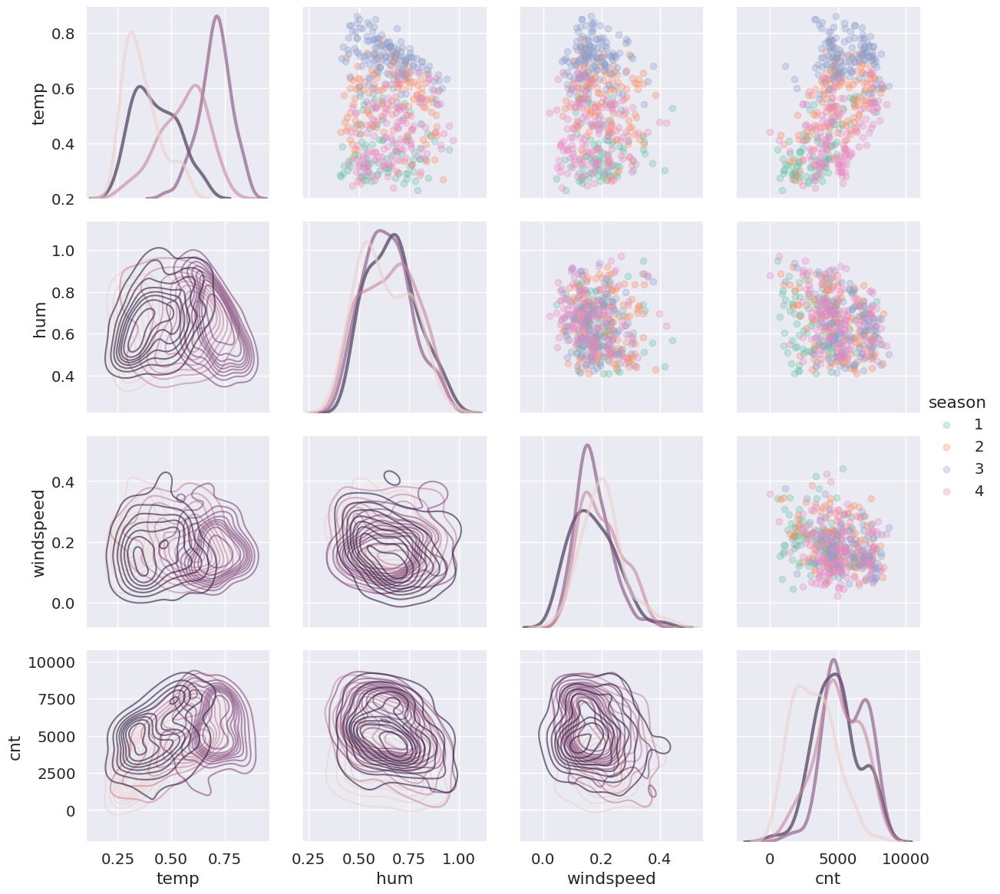

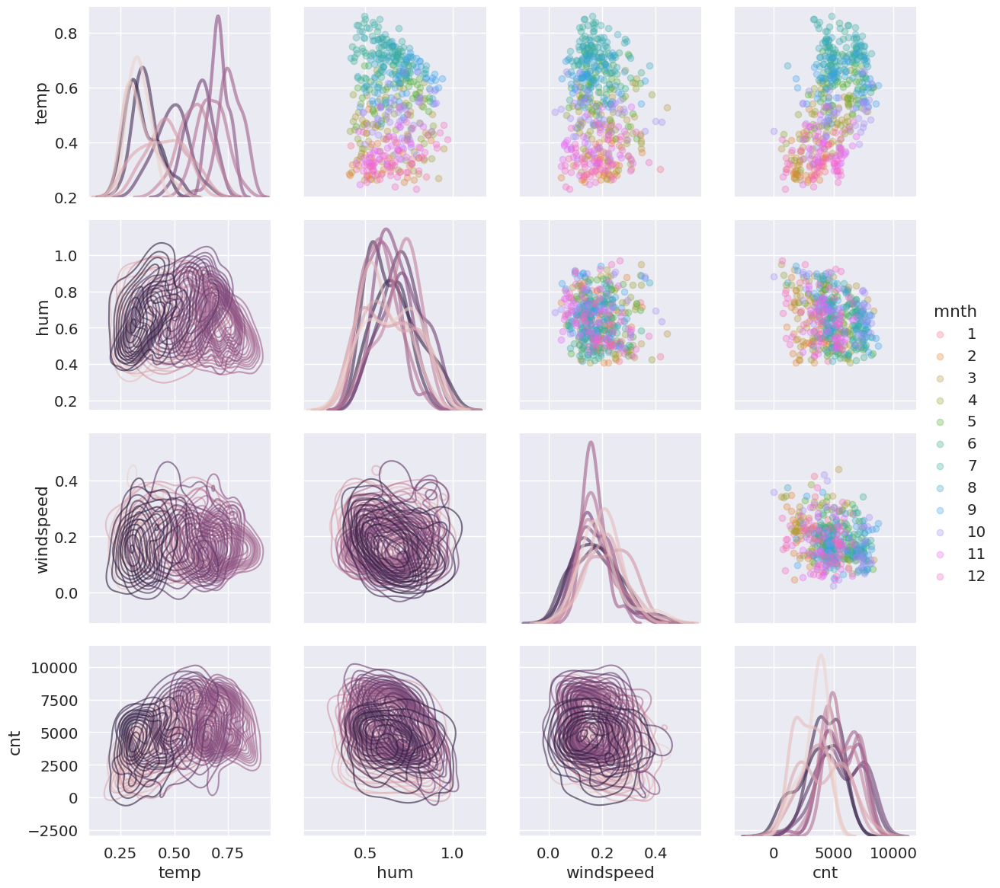

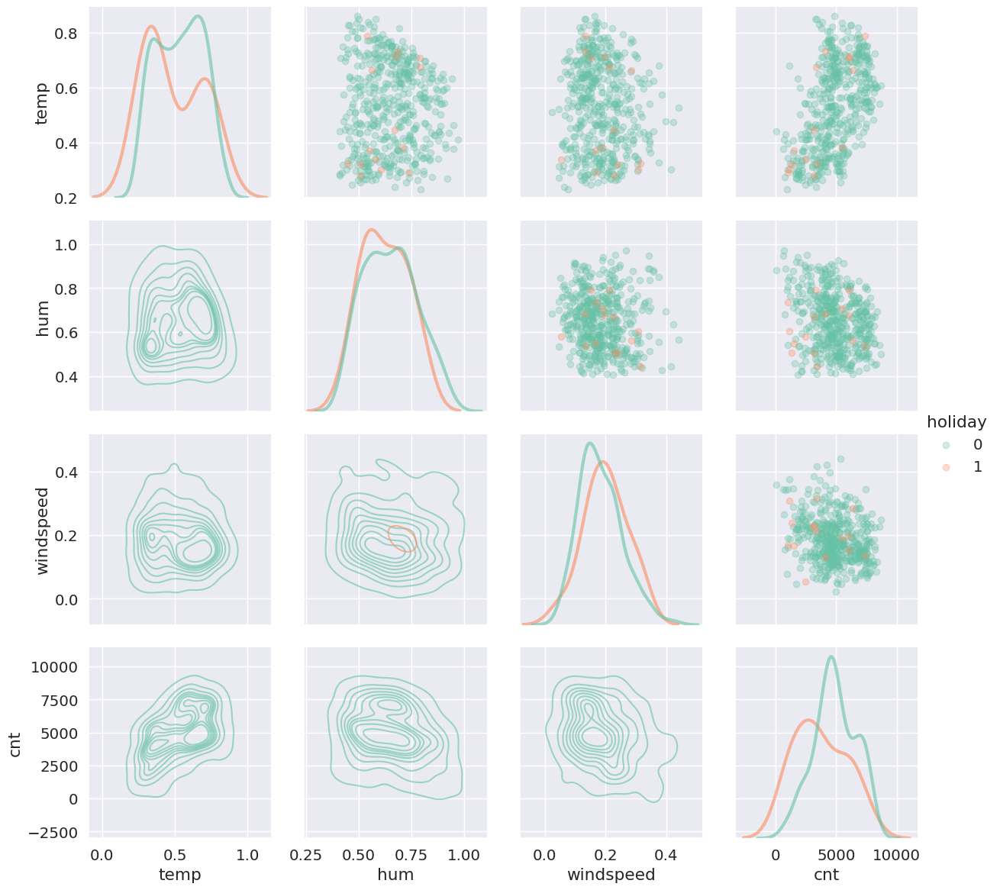

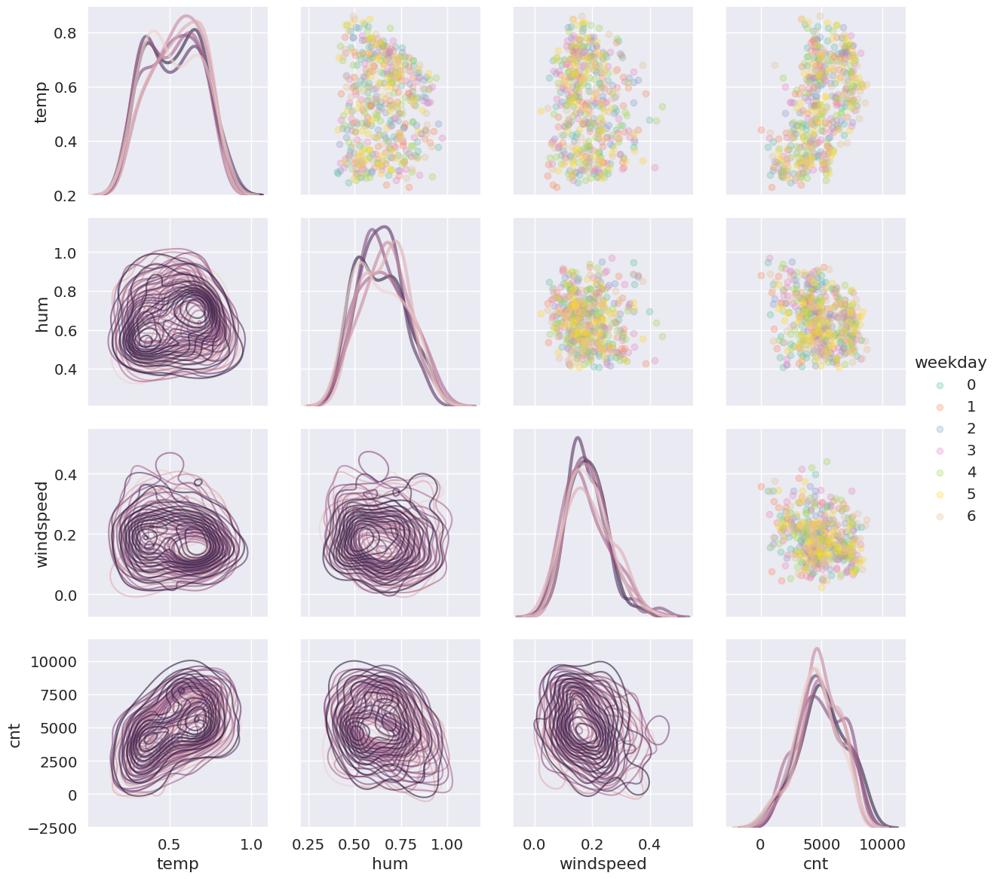

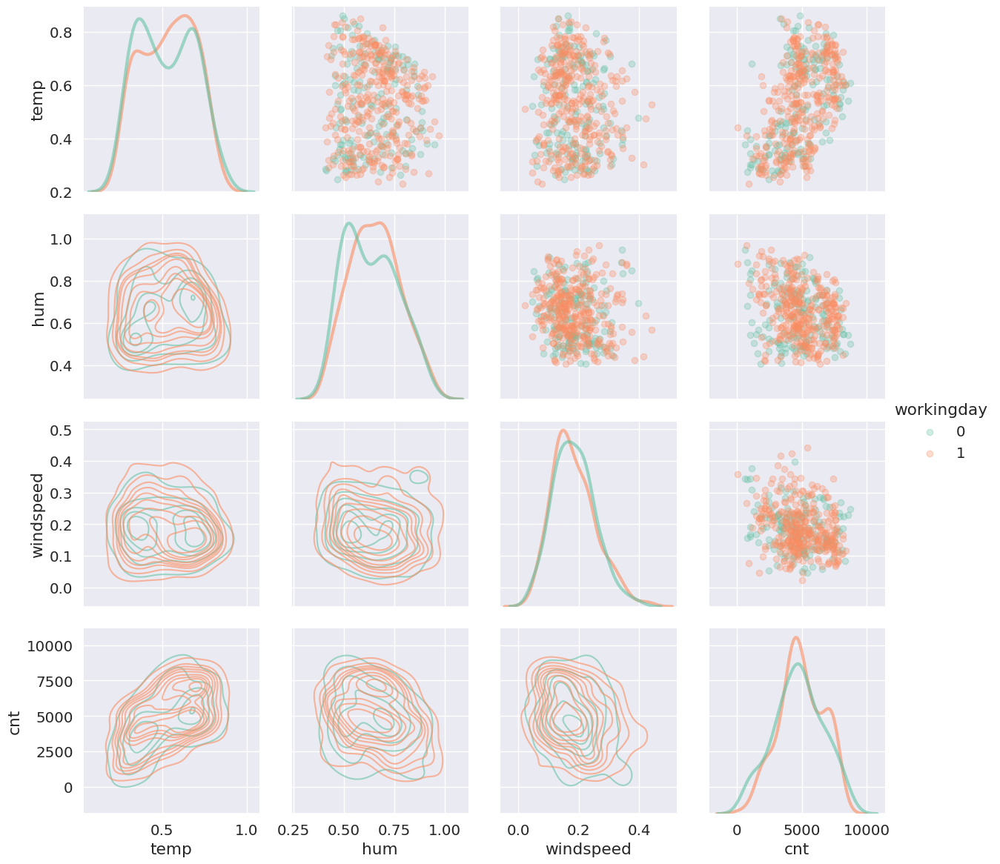

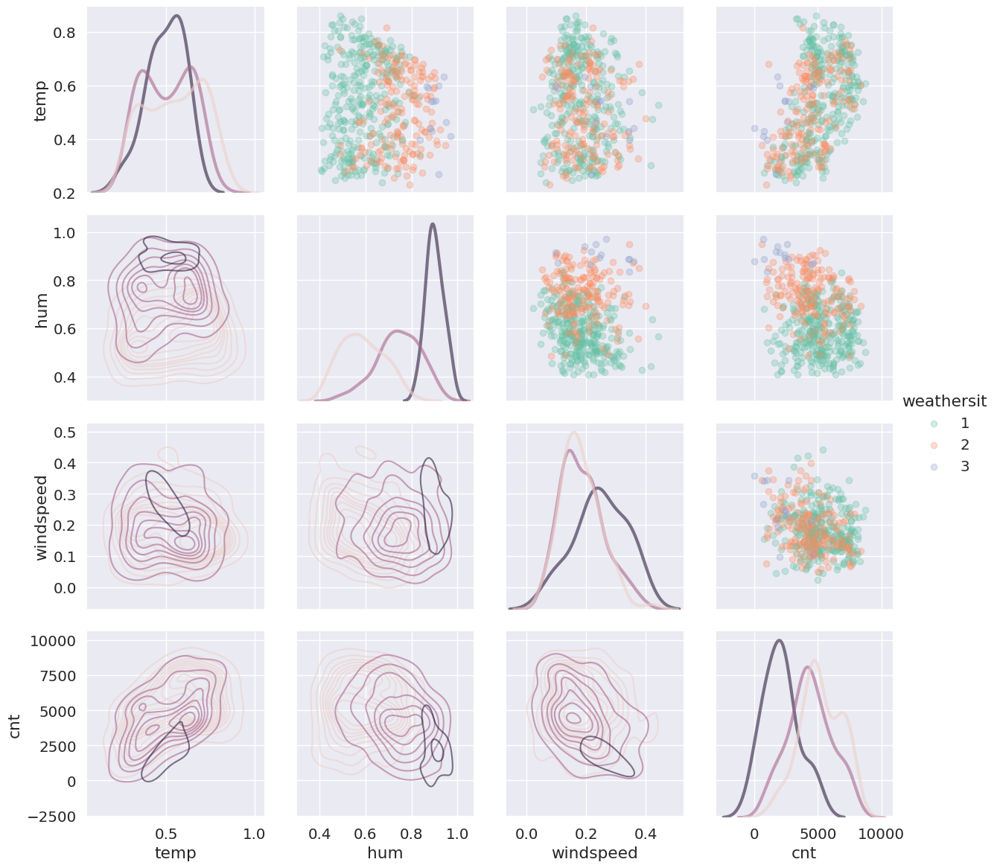

In [84]:
for hue in categorial_features:
    pair_grid = sns.PairGrid(
        train[["temp", "hum", "windspeed", "cnt", hue]],
        hue=hue,
        diag_sharey=False,
        height=3
    )
    
    pair_grid.map_lower(sns.kdeplot, alpha=0.6)
    pair_grid.map_upper(plt.scatter, alpha=0.3)
    pair_grid.map_diag(
        sns.kdeplot, lw=3, alpha=0.6, common_norm=False
    )

    pair_grid.add_legend()

Из графиков видно, что явных изолированных выбросов нету

In [85]:
encoder = OneHotEncoder(drop="first", sparse_output=False)  # объявляем модель
train_cat = encoder.fit_transform(train[categorial_features])  # обучаем и кодируем

X_train = np.hstack([train[real], train_cat])
X_train.shape

(499, 28)

In [86]:
test_cat = encoder.transform(test[categorial_features])
X_test = np.hstack([test[real], test_cat])
X_test.shape

(147, 28)

<!-- Внимание! Здесь находится специальная отметка. Ее нельзя удалять! Ответы на вопросы / выводы для предыдущего пункта(ов) пиши в ячейках выше! -->
<!-- c5124704b109dacbd9cf5647f50eb72c -->
#### 3. Обучение модели и ее анализ

Обучите линейную регрессию из `sklearn` на полученных данных и посмотрите на полученные оценки коэффициентов (в т.ч. свободный коэффициент).

In [87]:
model = LinearRegression(fit_intercept=True)
model.fit(X_train, train[target])
print(f"Коэффиценты: {model.coef_}\n", f"Свободный коэффицент: {model.intercept_}")

Коэффиценты: [ 3016.8346807   3199.15209474 -4329.69121798 -4292.16500228
  1332.30995196   842.10684267  1851.83780612  -540.50126375
   -65.80917374 -1081.73677441  -641.64623589 -1038.06209903
 -1356.07231063  -814.96595781    20.55557318  -515.23726206
 -1198.25241922  -784.99617092  -408.71895891  -153.58322383
    18.07861508   100.56610939    50.95212083   -11.14139995
   539.30473001   413.59118043   -81.49768925 -1805.57647076]
 Свободный коэффицент: 4565.326645921102


<!-- Внимание! Здесь находится специальная отметка. Ее нельзя удалять! Ответы на вопросы / выводы для предыдущего пункта(ов) пиши в ячейках выше! -->
<!-- 0e8e860f57fc7df75f236442f7206c78 -->
Посчитайте ошибку предсказания на тестовой выборке по метрикам RMSE, MAE, MAPE. Подробнее можно почитать в <a href="https://thetahat.ru/courses/ad/main/3/ad_linreg_sklearn">ноутбуке</a> с занятия.

*Замечание.* Если в тестовой части тоже есть "большие" выбросы, их стоит убрать. Наша модель не должна пытаться их предсказать (например, сбои в работе сервиса) но в то же время выбросы вносят существенный вклад в значение метрики. Особенно стоит обратить на это внимание в случае высоких значений метрик.

In [88]:
def mean_absolute_percentage_error(y_true: np.ndarray, y_pred: np.ndarray) -> float:
   return 100 * (np.abs(y_true - y_pred) / y_true).mean()

test_preds = model.predict(X_test)
print("RMSE:", metrics.mean_squared_error(test[target], test_preds) ** 0.5)
print("MAE:", metrics.mean_absolute_error(test[target], test_preds))
print("MAPE:", mean_absolute_percentage_error(test[target], test_preds))

RMSE: 1412.8533969714374
MAE: 1173.9770571154952
MAPE: 41.57426905600579


<!-- Внимание! Здесь находится специальная отметка. Ее нельзя удалять! Ответы на вопросы / выводы для предыдущего пункта(ов) пиши в ячейках выше! -->
<!-- 82920a034ed2865f8a7e2f03eaabceb6 -->
Попробуйте посчитать оценку коэффициентов с помощью формулы, полученной на занятии. Не забудьте про константный признак. В чем заключается проблема?

*Подсказка.* Подумайте о зависимостях между признаками. Причем, возможно, вы уже могли решить эту проблему на предыдущих этапах. В таком случае посмотрите, что будет, если "вернуть" проблему.

**Проблема** заключается в том, что у нас есть два очень сильно корелирующих между собой признака temp и atemp, что приводит к неправильной оценки коэфицента.

<!-- Внимание! Здесь находится специальная отметка. Ее нельзя удалять! Ответы на вопросы / выводы для предыдущего пункта(ов) пиши в ячейках выше! -->
<!-- 56aff27d604dbe90dda7b28a8da4e2e9 -->
Исправьте эту проблему, посчитайте оценки коэффициентов, а также ошибку предсказания.

In [ ]:
X = np.hstack([np.ones((X_train.shape[0], 1)), X_train]) #столбец единиц
Y = train[target].to_numpy()
theta = np.linalg.inv((X.T @ X)) @ X.T @ Y
theta_res = np.hstack([np.ones((X_test.shape[0], 1)), X_test]) @ theta
print("RMSE:", metrics.mean_squared_error(test[target], theta_res) ** 0.5)
print("MAE:", metrics.mean_absolute_error(test[target], theta_res))
print("MAPE:", mean_absolute_percentage_error(test[target], theta_res))

RMSE: 2.090327149491079e+16
MAE: 1.6486652615697526e+16
MAPE: 598271686463641.5


Видно, что линейная зависимость является очень сильным фктором,так как получены огромные значения.


In [90]:
#исправим
categorial_features = [
    "season",
    "mnth",
    "holiday",
    "weekday",
    "workingday",
    "weathersit",
]  # категориальные признаки
real_update = ["temp", "hum", "windspeed"]  # вещественные признаки
target = "cnt"  # целевой признак

In [91]:
X_train_update = np.hstack([train[real_update], train_cat])
model.fit(X_train_update, train[target])
X_test_update = np.hstack([test[real_update], test_cat])

In [92]:
X_upd = np.hstack([np.ones((X_train_update.shape[0], 1)), X_train_update])
Y_upd = train[target].to_numpy()
theta = np.linalg.inv((X_upd.T @ X_upd)) @ X_upd.T @ Y_upd
theta

array([ 6326.28235647,  8925.72322147, -3450.05956217, -7444.27374476,
        1620.23243821,  1305.9022596 ,  2198.03106145, -1191.31447684,
        -754.31929839, -2609.92445364, -2533.30034746, -3160.82669599,
       -3992.89994917, -3523.31854708, -1927.3551507 , -2410.32968194,
       -1971.92204365, -2184.29251031, -9591.85331839,  6666.83053322,
        3471.49397717,  5102.38360661,  3310.25748357,  3053.60836414,
         538.52712109, -5762.46721201,   -97.8717934 , -1850.11057551])

In [93]:
X_test_upd = np.hstack([np.ones((X_test_update.shape[0], 1)), X_test_update])
theta_res = X_test_upd @ theta

In [94]:
X = np.hstack([np.ones((X_train.shape[0], 1)), X_train])
Y = train[target].to_numpy()
theta = np.linalg.inv((X.T @ X)) @ X.T @ Y
theta_res = np.hstack([np.ones((X_test.shape[0], 1)), X_test]) @ theta
print("RMSE:", metrics.mean_squared_error(test[target], theta_res) ** 0.5)
print("MAE:", metrics.mean_absolute_error(test[target], theta_res))
print("MAPE:", mean_absolute_percentage_error(test[target], theta_res))

RMSE: 2.090327149491079e+16
MAE: 1.6486652615697526e+16
MAPE: 598271686463641.5


<!-- Внимание! Здесь находится специальная отметка. Ее нельзя удалять! Ответы на вопросы / выводы для предыдущего пункта(ов) пиши в ячейках выше! -->
<!-- 52266029600cdfda3b1cfce9e68f5c99 -->
Сделайте выводы.

**Выводы:**

честно сказать я очень сильно расстроился от таких результатов нашей модели. При наличии линейно зависимых признаков модель линейной регрессии будет работать неправильно - MAPE получилась порядка 10^16, что очень много, а при устранении этой ошибки можно добиться более точного результата, но даже так это получается достаточно много, притом модель линейной регрессии sklearn дает боле точный результат в 95%. 
Главный вывод, что нужно исключать линейно-зависимые признаки пр ипостроение модели

<!-- Внимание! Здесь находится специальная отметка. Ее нельзя удалять! Ответы на вопросы / выводы для предыдущего пункта(ов) пиши в ячейках выше! -->
<!-- 00000000000000000000000000000000 -->
*Замечание.* Не расстраивайтесь, если у вас получится не очень хорошее качество, это нормально. Вы провели только небольшую предобработку данных и обучили *простую* модель. Более сложные методы обработки данных и обучения ждут вас впереди. Главное &mdash; с чего-то начать!

<img src="https://thetahat.ru/files/ad/main/3/bike2.png">

<!-- Внимание! Здесь находится специальная отметка. Ее нельзя удалять! Ответы на вопросы / выводы для предыдущего пункта(ов) пиши в ячейках выше! -->
<!-- 2c0205cf5ab3ec02c6ea667faa01e48b -->
---
### Задача 3.

*Перед выполнением задачи ознакомтесь с <a href="https://thetahat.ru/courses/ad/main/3/ad_logreg_sklearn">ноутбуком по логистической регрессии</a> с занятия.*

> Одно из интересных свойств модели логистической регрессии — *при соблюдении её предположений* она дает возможность получать **несмещенные оценки вероятностей** принадлежности объекта к определенному классу.  
> Для пояснения рассмотрим объект $x$ и соответствующее предсказание вероятности $\widehat{p}(x)$ для класса 1. Если взять небольшую окрестность объекта $x$, то доля объектов класса 1 в этой окрестности будет приблизительно равна $\widehat{p}(x)$.  

Далее проверим это свойство на конкретных примерах.

С помощью кода ниже сгенерируйте данные, состоящие из одного вещественного признака и бинарного таргета.

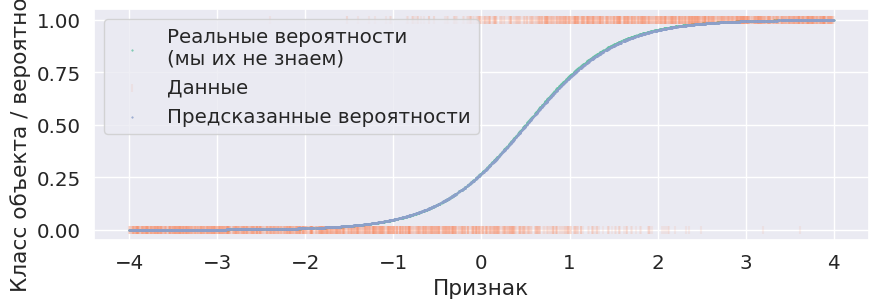

In [ ]:
sample_size = 3000  # Размер выборки

# Признаки
np.random.seed(42)  # для воспроизводимости
sample_size = 3000
X = np.random.uniform(low=-4, high=4, size=(sample_size, 1))

y_mean_true = 1 / (1 + np.exp(1 - 2 * X.ravel()))
y = np.random.binomial(n=1, p=y_mean_true)

# Обучение логистической регрессии
model = LogisticRegression(penalty='l2', C=1e10, solver='lbfgs')
model.fit(X, y)


# Предсказание вероятностей для класса 1
y_pred_proba = model.predict_proba(X)[:, 1]

plt.figure(figsize=(10, 3))
plt.scatter(X, y_mean_true, marker=".", s=1, label="Реальные вероятности\n(мы их не знаем)")
plt.scatter(X, y, marker="|", alpha=0.1, label="Данные")
plt.scatter(X, y_pred_proba, marker=".", s=1, label="Предсказанные вероятности")
plt.xlabel("Признак")
plt.ylabel("Класс объекта / вероятность")
plt.legend()
plt.show()

Обучите логистическую регрессию, используя реализацию из `sklearn`, при этом свободный коэффициент должен присутствовать в модели. Укажите также `penalty='none'`.

In [5]:
# Генерация данных
np.random.seed(42)
sample_size = 3000
X = np.random.uniform(low=-4, high=4, size=(sample_size, 1))

y_mean_true = 1 / (1 + np.exp(1 - 2 * X.ravel()))
y = np.random.binomial(n=1, p=y_mean_true)



In [7]:
# Обучение логистической регрессии без регуляризации
model = LogisticRegression(penalty=None, solver='lbfgs', fit_intercept=True)
model.fit(X, y)

# Предсказание вероятностей для класса 1
y_pred_proba = model.predict_proba(X)[:, 1]

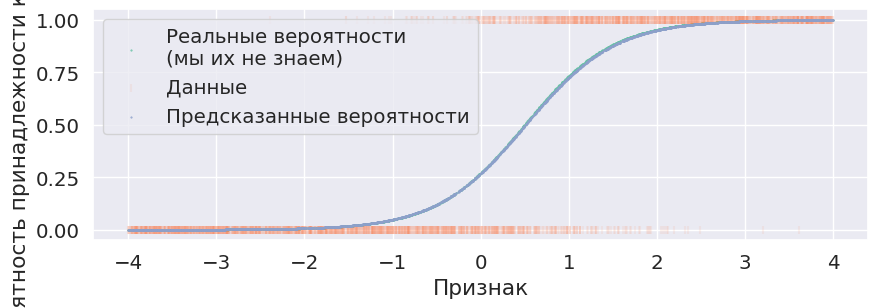

In [8]:
# Визуализация результатов
plt.figure(figsize=(10, 3))
plt.scatter(X, y_mean_true, marker=".", s=1, label="Реальные вероятности\n(мы их не знаем)")
plt.scatter(X, y, marker="|", alpha=0.1, label="Данные")
plt.scatter(X, y_pred_proba, marker=".", s=1, label="Предсказанные вероятности")
plt.xlabel("Признак")
plt.ylabel("Вероятность принадлежности к классу 1")
plt.legend()
plt.show()

Напечатайте оценку коэффициентов

In [10]:
print("Свободный коэффициент", model.intercept_)
print("Коэффициенты", model.coef_)


Свободный коэффициент [-1.00785894]
Коэффициенты [[1.97225845]]


Ниже объявлена сетка значений признака. По этой сетке постройте
* предсказания классов,
* предсказания вероятностей класса 1.

Визуализируйте эти предсказания. На график стоит нанести также обучающую выборку.

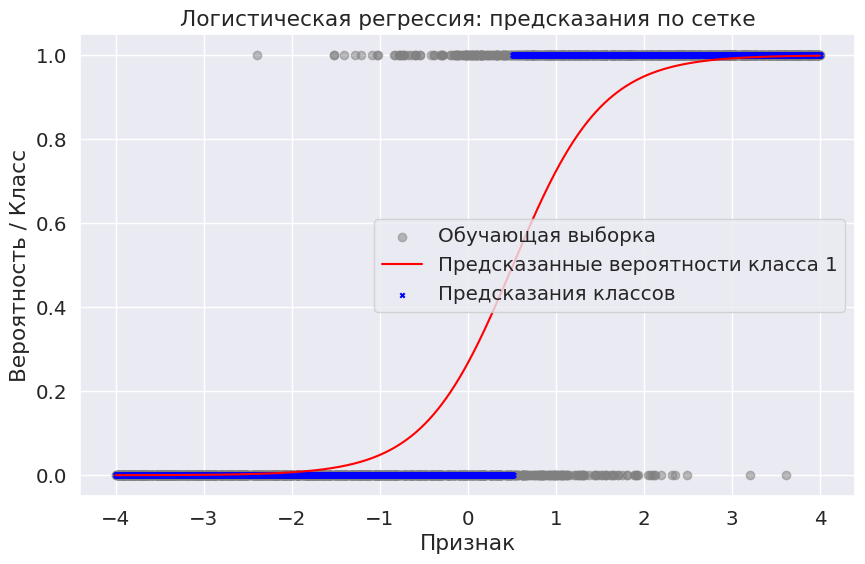

In [ ]:
X_grid = np.linspace(-4, 4, 10000).reshape((-1, 1))
# Предсказания классов по сетке
y_pred_class = model.predict(X_grid)

# Предсказания вероятностей для класса 1 по сетке
y_pred_proba = model.predict_proba(X_grid)[:, 1]

plt.figure(figsize=(10, 6))

# Обучающая выборка
plt.scatter(X, y, marker="o", color="gray", alpha=0.5, label="Обучающая выборка")

# Предсказанные вероятности (плавная линия)
plt.plot(X_grid, y_pred_proba, color="red", label="Предсказанные вероятности класса 1")

# Предсказания классов (точки)
plt.scatter(X_grid, y_pred_class, marker="x", color="blue", s=10, label="Предсказания классов")

plt.xlabel("Признак")
plt.ylabel("Вероятность / Класс")
plt.title("Логистическая регрессия: предсказания по сетке")
plt.legend()
plt.show()

Разбейте отрезок $[-4, 4]$ на одинаковые бины длины длины 0.2 и посчитайте в каждом бине долю объектов класса 1. Полученные значения добавьте на график предсказаний вероятностей и сравните эти графики. Проинтерпретируйте полученные результаты.

*Подсказка:* может помочь `np.digitize` и метод `groupby` для таблиц `pandas`. Рекомендуем посмотреть <a href="https://thetahat.ru/courses/python">обучающие ноутбуки</a> по библиотекам.

/tmp/ipykernel_81209/42990060.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = df.groupby('bin')['y'].mean().reset_index()


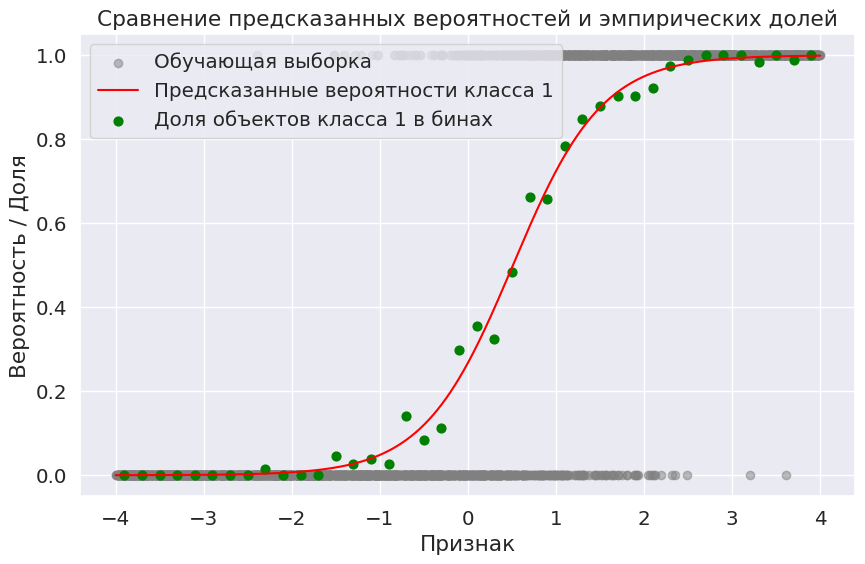

In [ ]:
X_grid = np.linspace(-4, 4, 10000).reshape((-1, 1))
y_pred_proba = model.predict_proba(X_grid)[:, 1]

df = pd.DataFrame({'X': X.flatten(), 'y': y})

# Разбиваем ось X бины с шагом 0.2
bin_edges = np.arange(-4, 4 + 0.2, 0.2)
df['bin'] = pd.cut(df['X'], bins=bin_edges, include_lowest=True)

# Группируем по бин и считаем среднее по столбцу y
bin_stats = df.groupby('bin')['y'].mean().reset_index()

# Вычисляем центр каждого интервала для нанесения на график
bin_stats['bin_center'] = bin_stats['bin'].apply(lambda interval: interval.mid)

plt.figure(figsize=(10, 6))

# Обучающая выборка (точки)
plt.scatter(X, y, marker="o", color="gray", alpha=0.5, label="Обучающая выборка")

plt.plot(X_grid, y_pred_proba, color="red", label="Предсказанные вероятности класса 1")

plt.scatter(bin_stats['bin_center'], bin_stats['y'], color="green", s=40,
            label="Доля объектов класса 1 в бинах")

plt.xlabel("Признак")
plt.ylabel("Вероятность / Доля")
plt.title("Сравнение предсказанных вероятностей и эмпирических долей")
plt.legend()
plt.show()

Повторите проведенное исследование для следующих данных и сравните результаты.

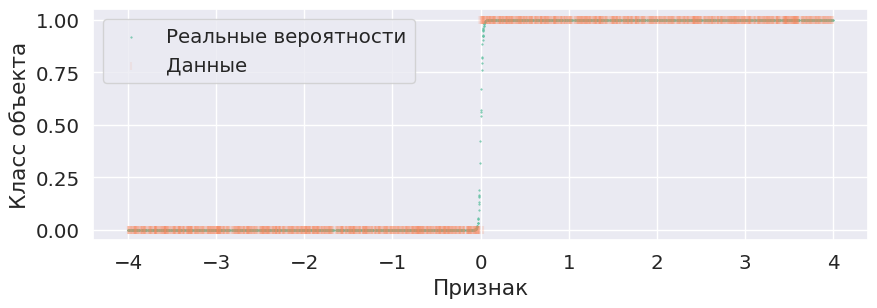

In [ ]:
# Признаки
X = np.random.uniform(low=-4, high=4, size=(sample_size, 1))

# Таргет
y_mean_true = 1 / (1 + np.exp(-100 * X.ravel()))
y = np.random.binomial(n=1, p=y_mean_true)

plt.figure(figsize=(10, 3))
plt.scatter(X, y_mean_true, marker=".", s=1, label="Реальные вероятности")
plt.scatter(X, y, marker="|", alpha=0.1, label="Данные")
plt.xlabel("Признак")
plt.ylabel("Класс объекта")
plt.legend()

**Выводы:**
В новом эксперименте логистическая функция стала почти ступенчатой. Для меньших значений признака вероятность близка к нулю, а для больших — к единице. Это приводит к резкому скачку предсказаний. Эмпирические доли объектов класса согласуются с моделью, демонстрируя почти бинарное поведение. Предыдущий эксперимент имел более плавный переход. При крутом переключении локальные ошибки могут увеличиваться. В целом модель остаётся калиброванной. Результаты подтверждают теоретические свойства логистической регрессии.

---
### Задача 4.

<!-- Внимание! Здесь находится специальная отметка. Ее нельзя удалять! Ответы на вопросы / выводы для предыдущего пункта(ов) пиши в ячейках выше! -->
<!-- f92a2876d3f2b0d01fc396776be023a9 -->
Продолжим исследовать модель логистической регрессии. Сгенерируем данные, состоящие из двух бинарных признаков и бинарного таргета

In [5]:
probs = np.random.uniform(size=8)
probs /= probs.sum()
probs

x = np.random.choice(np.arange(8), p=probs, size=10000)
data = pd.DataFrame(
    np.unpackbits(np.array(x.reshape(-1, 1), dtype=">i8").view(np.uint8), axis=1)[:, -3:],
    columns=["feature_1", "feature_2", "target"],
)
data.head()

,feature_1,feature_2,target
0,0,1,0
1,0,0,1
2,0,0,1
3,0,0,1
4,1,1,1


Особенность таких данных &mdash; конечное число *возможных различных* объектов. В данном случае их всего 4, по количеству всех возможных комбинаций значений признака. Соответственно, любой моделью мы можем сделать только 4 *различных* предсказания. Исследуем, как с этим справляется логистическая регрессия.

Сначала для сравнения посчитайте долю класса 1 для каждой категории объектов.

*Подсказка:* используйте `pd.pivot_table`. Рекомендуем посмотреть <a href="https://thetahat.ru/courses/python">обучающие ноутбуки</a> по библиотекам.

In [6]:
pivot = pd.pivot_table(data, index=["feature_1", "feature_2"], values="target", aggfunc="mean")
print(pivot)

                       target
feature_1 feature_2          
0         0          0.637518
          1          0.228463
1         0          0.015857
          1          0.451694


<!-- Внимание! Здесь находится специальная отметка. Ее нельзя удалять! Ответы на вопросы / выводы для предыдущего пункта(ов) пиши в ячейках выше! -->
<!-- 14e68d57d58f901b3350e63f76b9f8db -->
Обучите логистическую регрессию с `penalty='none'` и получите предсказания вероятностей для этих четырех типов объектов. Представьте результаты в таком виде, чтобы их удобно было сравнивать с частотами, посчитанными ранее.

In [11]:
X = data[["feature_1", "feature_2"]]
y = data["target"]

# Обучаем без регуляризации
model = LogisticRegression(penalty=None, solver='lbfgs', fit_intercept=True)
model.fit(X, y)

# Создаём DataFrame с уникальными комбинациями признаков
combinations = pd.DataFrame([[i, j] for i in [0, 1] for j in [0, 1]],
                            columns=["feature_1", "feature_2"])

combinations["predicted_proba"] = model.predict_proba(combinations)[:, 1]

pivot = pd.pivot_table(data, index=["feature_1", "feature_2"],
                       values="target", aggfunc="mean").reset_index()
pivot = pivot.rename(columns={"target": "empirical_freq"})

result = pd.merge(combinations, pivot, on=["feature_1", "feature_2"], how="left")
print(result)


   feature_1  feature_2  predicted_proba  empirical_freq
0          0          0         0.452541        0.637518
1          0          1         0.471099        0.228463
2          1          0         0.276608        0.015857
3          1          1         0.291796        0.451694


<!-- Внимание! Здесь находится специальная отметка. Ее нельзя удалять! Ответы на вопросы / выводы для предыдущего пункта(ов) пиши в ячейках выше! -->
<!-- 1b868a951c9dec0be47540d5316f7e9f -->
Почему результаты не совпадают?

Для ответа на этот вопрос распишите формулу, которая задает модель логистической регрессии, указав все параметры. Какое предположение о данных при этом делает логистическая регрессия?

Логистическая регрессия задаёт вероятность принадлежности к классу 1 по формуле

$$
\widehat{p}(x) = \sigma\left(x^T \widehat{\theta}\right) = \frac{1}{1+\exp\left(-x^T \widehat{\theta}\right)},
$$

а при обучении методом `fit` минимизируется функция потерь

$$
\min_{\theta} \sum_{i=1}^{n} \left[-Y_i \log\left(\sigma\left(x_i^T \theta\right)\right) - (1-Y_i) \log\left(1-\sigma\left(x_i^T \theta\right)\right)\right],
$$

где $(\sigma(z)=\frac{1}{1+\exp(-z)})$. При этом модель делает предположение, что логарифм отношения шансов линейно зависит от признаков, то есть

$$
\log\frac{\widehat{p}(x)}{1-\widehat{p}(x)} = x^T \widehat{\theta}.
$$

В случае данных с конечным числом уникальных объектов (здесь всего 4 комбинации значений бинарных признаков) эмпирическая частота наблюдения класса 1 для каждой группы может отличаться от параметрически оценённой вероятности, поскольку модель вынуждена аппроксимировать все наблюдения одной логистической функцией. Таким образом, предсказанные вероятности не совпадают с эмпирическими частотами, так как логистическая регрессия ищет оптимальное параметрическое приближение, минимизируя функцию потерь, а не просто воспроизводит наблюдаемые доли.

<!-- Внимание! Здесь находится специальная отметка. Ее нельзя удалять! Ответы на вопросы / выводы для предыдущего пункта(ов) пиши в ячейках выше! -->
<!-- 1180c36f8ac39574c944b19ddee07271 -->
Предложите и реализуйте способ построения модели логистической регрессии так, чтобы она точнее предсказывала частоты, посчитанные ранее.

Опишите ваше предложение:

Одним из способов заставить модель точнее предсказывать агрегированные частоты является обучение на агрегированных данных с использованием весов, отражающих число наблюдений в каждой категории. То есть вместо того, чтобы подавать на вход индивидуальные наблюдения, мы агрегируем их по уникальным комбинациям признаков и обучаем модель на этих агрегированных группах с соответствующими весами.

Напомним, что классическая модель логистической регрессии задаётся уравнением

$$
\widehat{p}(x) = \sigma\left(x^T \widehat{\theta}\right) = \frac{1}{1+\exp\left(-x^T \widehat{\theta}\right)},
$$

а оптимальные параметры $\widehat{\theta}$ находятся посредством минимизации функции потерь

$$
\min_{\theta} \sum_{i=1}^{n} \left[-Y_i \log\left(\sigma\left(x_i^T \theta\right)\right) - (1-Y_i) \log\left(1-\sigma\left(x_i^T \theta\right)\right)\right].
$$

Это подразумевает предположение о том, что логарифм отношения шансов линейно зависит от признаков:

$$
\log\frac{\widehat{p}(x)}{1-\widehat{p}(x)} = x^T \widehat{\theta}.
$$

При наличии всего четырёх различных объектов (уникальных комбинаций бинарных признаков) эмпирическая частота для каждой группы может существенно отличаться от параметрически оценённой вероятности, поскольку модель пытается «усреднить» данные по всему объёму выборки.

Чтобы добиться лучшего соответствия эмпирическим частотам, предлагается следующий подход:

1. Агрегировать данные по уникальным комбинациям признаков, для каждой группы вычислив общее число наблюдений и число успехов (объектов класса 1).
2. Построить новую выборку, где для каждой группы создать две записи: одну с меткой $Y=1$ с весом, равным числу успехов, и другую с меткой $Y=0$ с весом, равным числу неуспехов.
3. Обучить логистическую регрессию с использованием параметра `sample_weight`, равного соответствующим весам, так чтобы вклад каждой группы был пропорционален её объёму.

Таким образом, модель будет оптимизировать взвешенную функцию потерь, что приводит к параметрам $\widehat{\theta}$, лучше согласующимся с агрегированными (наблюдаемыми) частотами.


Реализация:

In [12]:
# Агрегируем данные по уникальным комбинациям признаков
agg = data.groupby(["feature_1", "feature_2"])["target"].agg(["sum", "count"]).reset_index()
agg["failures"] = agg["count"] - agg["sum"]

# Создаем новую выборку с весами: для каждой группы создаем две записи,
rows = []
for _, row in agg.iterrows():
    f1 = row["feature_1"]
    f2 = row["feature_2"]
    successes = row["sum"]
    failures = row["failures"]
    # Добавляем запись для успехов, если они есть
    if successes > 0:
        rows.append({"feature_1": f1, "feature_2": f2, "target": 1, "weight": successes})
    # Добавляем запись для неуспехов, если они есть
    if failures > 0:
        rows.append({"feature_1": f1, "feature_2": f2, "target": 0, "weight": failures})
new_data = pd.DataFrame(rows)

# Обучаем
X_new = new_data[["feature_1", "feature_2"]]
y_new = new_data["target"]
weights = new_data["weight"]

model_weighted = LogisticRegression(penalty=None, solver='lbfgs', fit_intercept=True)
model_weighted.fit(X_new, y_new, sample_weight=weights)

# Предсказываем
combinations = pd.DataFrame([[i, j] for i in [0, 1] for j in [0, 1]],
                            columns=["feature_1", "feature_2"])
combinations["predicted_proba"] = model_weighted.predict_proba(combinations)[:, 1]
print(combinations)


   feature_1  feature_2  predicted_proba
0          0          0         0.452541
1          0          1         0.471099
2          1          0         0.276608
3          1          1         0.291796


<!-- Внимание! Здесь находится специальная отметка. Ее нельзя удалять! Ответы на вопросы / выводы для предыдущего пункта(ов) пиши в ячейках выше! -->
<!-- 3f951c224a4ac471c658ed7755ff9521 -->
**Выводы:**

Стандартная логистическая регрессия, минимизирующая функцию потерь

$$
\min_{\theta}\sum_{i=1}^{n}\left[-Y_i\log\left(\sigma\left(x_i^T\theta\right)\right) - (1-Y_i)\log\left(1-\sigma\left(x_i^T\theta\right)\right)\right],
$$

строит модель, где

$$
\widehat{p}(x)=\sigma\left(x^T\widehat{\theta}\right)=\frac{1}{1+\exp\left(-x^T\widehat{\theta}\right)}
$$

и предполагается, что логит $\log\frac{\widehat{p}(x)}{1-\widehat{p}(x)}$ является линейной функцией от признаков. При наличии всего четырёх уникальных объектов эмпирические частоты, посчитанные для каждой комбинации признаков, могут значительно различаться между собой. Это приводит к тому, что модель, обученная на индивидуальных наблюдениях, оптимизирует среднюю ошибку по всей выборке и не может точно восстановить частоты для каждой группы. Чтобы модель точнее предсказывала наблюдаемые частоты, предлагается агрегировать данные по уникальным комбинациям признаков и использовать веса, соответствующие объему наблюдений в каждой группе, при обучении с помощью параметра sample_weight. Такой подход позволяет скорректировать вклад каждой группы в оптимизацию и сделать предсказания модели ближе к эмпирическим значениям.

<!-- Внимание! Здесь находится специальная отметка. Ее нельзя удалять! Ответы на вопросы / выводы для предыдущего пункта(ов) пиши в ячейках выше! -->
<!-- 00000000000000000000000000000000 -->
---
### <font color="orange"><i>Сложная часть</i></font>

Задачи 5-7: скачайте второй ноутбук с условием задания со страницы курса.